In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/flickr8k/captions.txt
/kaggle/input/flickr8k/Images/3226254560_2f8ac147ea.jpg
/kaggle/input/flickr8k/Images/214543992_ce6c0d9f9b.jpg
/kaggle/input/flickr8k/Images/2366643786_9c9a830db8.jpg
/kaggle/input/flickr8k/Images/3368819708_0bfa0808f8.jpg
/kaggle/input/flickr8k/Images/2190227737_6e0bde2623.jpg
/kaggle/input/flickr8k/Images/2752809449_632cd991b3.jpg
/kaggle/input/flickr8k/Images/3097776588_312932e438.jpg
/kaggle/input/flickr8k/Images/1206506157_c7956accd5.jpg
/kaggle/input/flickr8k/Images/1319634306_816f21677f.jpg
/kaggle/input/flickr8k/Images/2465218087_fca77998c6.jpg
/kaggle/input/flickr8k/Images/3351493005_6e5030f596.jpg
/kaggle/input/flickr8k/Images/2949337912_beba55698b.jpg
/kaggle/input/flickr8k/Images/534886684_a6c9f40fa1.jpg
/kaggle/input/flickr8k/Images/3543600125_223747ef4c.jpg
/kaggle/input/flickr8k/Images/2174206711_11cb712a8d.jpg
/kaggle/input/flickr8k/Images/280706862_14c30d734a.jpg
/kaggle/input/flickr8k/Images/2100735137_05c6079537.jpg
/kaggle/input/f

In [ ]:
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
from collections import Counter
from torch.nn.utils.rnn import pad_sequence, pack_padded_sequence

from sklearn.preprocessing import LabelEncoder


In [ ]:
BASE_DIR = '/kaggle/input/flickr8k'
WORKING_DIR = '/kaggle/working'

In [ ]:
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image

# Load VGG16 model
vgg16 = models.vgg16(pretrained=True)
# Restructure the model
vgg16.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-1])
vgg16.eval()  # Set to evaluation mode
print(vgg16)

# Function to preprocess the image
def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)  # Add batch dimension
    return image

# Extract features from images
features = {}
directory = os.path.join(BASE_DIR, 'Images')

for img_name in tqdm(os.listdir(directory)):
    # Load the image from file
    img_path = os.path.join(directory, img_name)
    image = preprocess_image(img_path)
    # Extract features
    with torch.no_grad():
        feature = vgg16(image).numpy()
    # Get image ID
    image_id = img_name.split('.')[0]
    # Store feature
    features[image_id] = feature

# Store features in pickle
with open(os.path.join(WORKING_DIR, 'features.pkl'), 'wb') as f:
    pickle.dump(features, f)

# Load features from pickle
with open(os.path.join(WORKING_DIR, 'features.pkl'), 'rb') as f:
    features = pickle.load(f)


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:03<00:00, 155MB/s]  


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

  0%|          | 0/8091 [00:00<?, ?it/s]

## Load the Captions Data

In [ ]:
# Read captions from file
captions_file = os.path.join(BASE_DIR, 'captions.txt')

with open(captions_file, 'r') as f:
    next(f)  # Skip the header if there is one
    captions_doc = f.read()


In [ ]:
# Create mapping of image to captions
mapping = {}
# Process lines
for line in tqdm(captions_doc.split('\n')):
    # Split the line by comma
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    # Remove extension from image ID
    image_id = image_id.split('.')[0]
    # Convert caption list to string
    caption = " ".join(caption).strip()
    # Create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    # Store the caption
    mapping[image_id].append(caption)

print(len(mapping))


  0%|          | 0/40456 [00:00<?, ?it/s]

8091


## Preprocess Text Data

In [ ]:
import re

def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # Take one caption at a time
            caption = captions[i]
            # Preprocessing steps
            # Convert to lowercase
            caption = caption.lower()
            # Delete digits, special chars, etc.
            caption = re.sub(r'[^a-zA-Z\s]', '', caption)
            # Delete additional spaces
            caption = re.sub(r'\s+', ' ', caption).strip()
            # Add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word) > 1]) + ' endseq'
            captions[i] = caption


In [ ]:
# Before preprocessing of text
print(mapping['1000268201_693b08cb0e'])

# Preprocess the text
clean(mapping)

# After preprocessing of text
print(mapping['1000268201_693b08cb0e'])


['A child in a pink dress is climbing up a set of stairs in an entry way .', 'A girl going into a wooden building .', 'A little girl climbing into a wooden playhouse .', 'A little girl climbing the stairs to her playhouse .', 'A little girl in a pink dress going into a wooden cabin .']
['startseq child in pink dress is climbing up set of stairs in an entry way endseq', 'startseq girl going into wooden building endseq', 'startseq little girl climbing into wooden playhouse endseq', 'startseq little girl climbing the stairs to her playhouse endseq', 'startseq little girl in pink dress going into wooden cabin endseq']


In [ ]:
# Collect all captions
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

# Print the number of captions
print(len(all_captions))

# Print the first 10 captions
print(all_captions[:10])


40455
['startseq child in pink dress is climbing up set of stairs in an entry way endseq', 'startseq girl going into wooden building endseq', 'startseq little girl climbing into wooden playhouse endseq', 'startseq little girl climbing the stairs to her playhouse endseq', 'startseq little girl in pink dress going into wooden cabin endseq', 'startseq black dog and spotted dog are fighting endseq', 'startseq black dog and tricolored dog playing with each other on the road endseq', 'startseq black dog and white dog with brown spots are staring at each other in the street endseq', 'startseq two dogs of different breeds looking at each other on the road endseq', 'startseq two dogs on pavement moving toward each other endseq']


In [ ]:
from collections import Counter
from sklearn.preprocessing import LabelEncoder

# Tokenize the text
counter = Counter()
for caption in all_captions:
    counter.update(caption.split())

# Create a vocabulary and assign indices to words
vocab = {word: idx + 1 for idx, (word, _) in enumerate(counter.items())}
vocab_size = len(vocab) + 1

print(vocab_size)

# Get the maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
print(max_length)


8768
34


In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

# Train-test split
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train_ids = image_ids[:split]
test_ids = image_ids[split:]

class ImageCaptionDataset(Dataset):
    def __init__(self, data_keys, mapping, features, vocab, max_length):
        self.data_keys = data_keys
        self.mapping = mapping
        self.features = features
        self.vocab = vocab
        self.max_length = max_length

    def __len__(self):
        return len(self.data_keys)

    def __getitem__(self, index):
        key = self.data_keys[index]
        captions = self.mapping[key]
        feature = self.features[key][0]

        X1, X2, y = [], [], []

        for caption in captions:
            seq = [self.vocab[word] for word in caption.split() if word in self.vocab]
            for i in range(1, len(seq)):
                in_seq, out_seq = seq[:i], seq[i]
                in_seq = F.pad(torch.tensor(in_seq), (0, self.max_length - len(in_seq)), 'constant', 0)
                out_seq = F.one_hot(torch.tensor(out_seq), num_classes=len(self.vocab) + 1)
                X1.append(feature)
                X2.append(in_seq)
                y.append(out_seq)

        return torch.tensor(X1), torch.stack(X2), torch.stack(y)

# Data generators
def data_generator(data_keys, mapping, features, vocab, max_length, batch_size):
    dataset = ImageCaptionDataset(data_keys, mapping, features, vocab, max_length)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)




## creating model

In [ ]:
pip install torchsummary

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

class ImageCaptionModel(nn.Module):
    def __init__(self, vocab_size, max_length):
        super(ImageCaptionModel, self).__init__()
        self.image_fc = nn.Sequential(
            nn.Dropout(0.4),
            nn.Linear(4096, 256),
            nn.ReLU()
        )
        self.text_embedding = nn.Embedding(vocab_size, 256, padding_idx=0)
        self.text_lstm = nn.LSTM(256, 256, batch_first=True)
        self.fc1 = nn.Linear(256, 256)
        self.fc2 = nn.Linear(256, vocab_size)

    def forward(self, image, text):
        # Image feature layers
        image_features = self.image_fc(image)

        # Sequence feature layers
        text_embeddings = self.text_embedding(text)
        text_embeddings = F.dropout(text_embeddings, 0.4)
        _, (text_features, _) = self.text_lstm(text_embeddings)
        text_features = text_features.squeeze(0)

        # Decoder model
        combined_features = image_features + text_features
        x = F.relu(self.fc1(combined_features))
        outputs = F.log_softmax(self.fc2(x), dim=1)

        return outputs

# Initialize the model, loss function, and optimizer
vocab_size = len(vocab) + 1
max_length = max(len(caption.split()) for caption in all_captions)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = ImageCaptionModel(vocab_size, max_length).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Example input to test the model (make sure inputs are on the same device as the model)
example_image = torch.randn(1, 4096).to(device)
example_text = torch.randint(0, vocab_size, (1, max_length), dtype=torch.long).to(device)
output = model(example_image, example_text)
print(output.shape)

# Print model summary manually
print(model)

# Print layer details
for name, layer in model.named_children():
    print(f"{name}: {layer}")


torch.Size([1, 8768])
ImageCaptionModel(
  (image_fc): Sequential(
    (0): Dropout(p=0.4, inplace=False)
    (1): Linear(in_features=4096, out_features=256, bias=True)
    (2): ReLU()
  )
  (text_embedding): Embedding(8768, 256, padding_idx=0)
  (text_lstm): LSTM(256, 256, batch_first=True)
  (fc1): Linear(in_features=256, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=8768, bias=True)
)
image_fc: Sequential(
  (0): Dropout(p=0.4, inplace=False)
  (1): Linear(in_features=4096, out_features=256, bias=True)
  (2): ReLU()
)
text_embedding: Embedding(8768, 256, padding_idx=0)
text_lstm: LSTM(256, 256, batch_first=True)
fc1: Linear(in_features=256, out_features=256, bias=True)
fc2: Linear(in_features=256, out_features=8768, bias=True)


In [ ]:
# Train-test split
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train_ids = image_ids[:split]
test_ids = image_ids[split:]

In [ ]:
len(train_ids)
len(test_ids)

810

In [ ]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset

class ImageCaptionDataset(Dataset):
    def __init__(self, data_keys, mapping, features, vocab, max_length):
        self.data_keys = data_keys
        self.mapping = mapping
        self.features = features
        self.vocab = vocab
        self.max_length = max_length

    def __len__(self):
        return len(self.data_keys)

    def __getitem__(self, index):
        key = self.data_keys[index]
        captions = self.mapping[key]
        feature = self.features[key][0]

        X1, X2, y = [], [], []

        for caption in captions:
            seq = [self.vocab[word] for word in caption.split() if word in self.vocab]
            for i in range(1, len(seq)):
                in_seq, out_seq = seq[:i], seq[i]
                in_seq = F.pad(torch.tensor(in_seq, dtype=torch.long), (0, self.max_length - len(in_seq)), 'constant', 0)
                out_seq = F.one_hot(torch.tensor(out_seq, dtype=torch.long), num_classes=len(self.vocab) + 1)
                X1.append(torch.tensor(feature, dtype=torch.float32))
                X2.append(in_seq)
                y.append(out_seq)

        X1 = torch.stack(X1)
        X2 = torch.stack(X2)
        y = torch.stack(y)

        return X1, X2, y

def collate_batch(batch, max_length):
    X1 = [item[0] for item in batch]
    X2 = [item[1] for item in batch]
    y = [item[2] for item in batch]

    X1 = torch.cat(X1)
    X2 = torch.cat(X2)
    y = torch.cat(y)

    return X1, X2, y

def data_generator(data_keys, mapping, features, vocab, max_length, batch_size):
    dataset = ImageCaptionDataset(data_keys, mapping, features, vocab, max_length)
    return DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=lambda x: collate_batch(x, max_length))


In [ ]:
# Modify the training loop to track losses and BLEU scores
train_losses = []
val_losses = []
val_bleu1_scores = []
val_bleu2_scores = []
val_bleu3_scores = []
val_bleu4_scores = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    generator = data_generator(train_ids, mapping, features, vocab, max_length, batch_size)

    for batch_idx, (X1, X2, y) in enumerate(generator):
        X1, X2, y = X1.to(device), X2.to(device), y.to(device)

        optimizer.zero_grad()
        output = model(X1, X2)

        # Reshape output and target to be compatible with CrossEntropyLoss
        output = output.view(-1, vocab_size)
        y = y.view(-1, vocab_size)

        # Calculate loss
        loss = criterion(output, y.argmax(dim=1))
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    train_losses.append(running_loss / len(generator))

    # Validation step
    model.eval()
    val_loss = 0.0
    actual, predicted = list(), list()
    val_generator = data_generator(test_ids, mapping, features, vocab, max_length, batch_size)

    with torch.no_grad():
        for batch_idx, (X1, X2, y) in enumerate(val_generator):
            X1, X2, y = X1.to(device), X2.to(device), y.to(device)
            output = model(X1, X2)
            output = output.view(-1, vocab_size)
            y = y.view(-1, vocab_size)
            loss = criterion(output, y.argmax(dim=1))
            val_loss += loss.item()

            # BLEU score calculation
            start_idx = batch_idx * batch_size
            for i in range(len(X1)):
                actual_idx = start_idx + i
                if actual_idx >= len(test_ids):
                    break
                image_feature = X1[i].cpu().numpy()
                actual_captions = mapping[test_ids[actual_idx]]
                predicted_caption = predict_caption(model, image_feature, vocab, max_length, device)
                actual.append([caption.split() for caption in actual_captions])
                predicted.append(predicted_caption.split())

    val_losses.append(val_loss / len(val_generator))

    bleu1 = corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0))
    bleu2 = corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0))
    bleu3 = corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0))
    bleu4 = corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25))

    val_bleu1_scores.append(bleu1)
    val_bleu2_scores.append(bleu2)
    val_bleu3_scores.append(bleu3)
    val_bleu4_scores.append(bleu4)

    print(f"Epoch [{epoch+1}/{epochs}], Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}, "
          f"BLEU-1: {bleu1:.4f}, BLEU-2: {bleu2:.4f}, BLEU-3: {bleu3:.4f}, BLEU-4: {bleu4:.4f}")

# Save the model
model_path = os.path.join(WORKING_DIR, 'best_model.pth')
torch.save(model.state_dict(), model_path)


Epoch [1/20], Train Loss: 1.9281, Val Loss: 4.5920, BLEU-1: 0.4076, BLEU-2: 0.1432, BLEU-3: 0.0629, BLEU-4: 0.0278
Epoch [2/20], Train Loss: 1.9167, Val Loss: 4.6052, BLEU-1: 0.4109, BLEU-2: 0.1514, BLEU-3: 0.0691, BLEU-4: 0.0317
Epoch [3/20], Train Loss: 1.9084, Val Loss: 4.6490, BLEU-1: 0.3977, BLEU-2: 0.1403, BLEU-3: 0.0631, BLEU-4: 0.0277
Epoch [4/20], Train Loss: 1.9031, Val Loss: 4.6567, BLEU-1: 0.3984, BLEU-2: 0.1423, BLEU-3: 0.0634, BLEU-4: 0.0275
Epoch [5/20], Train Loss: 1.8948, Val Loss: 4.7009, BLEU-1: 0.4103, BLEU-2: 0.1513, BLEU-3: 0.0691, BLEU-4: 0.0310
Epoch [6/20], Train Loss: 1.8832, Val Loss: 4.6913, BLEU-1: 0.4127, BLEU-2: 0.1497, BLEU-3: 0.0664, BLEU-4: 0.0295
Epoch [7/20], Train Loss: 1.8777, Val Loss: 4.6894, BLEU-1: 0.3975, BLEU-2: 0.1405, BLEU-3: 0.0628, BLEU-4: 0.0277
Epoch [8/20], Train Loss: 1.8686, Val Loss: 4.7156, BLEU-1: 0.3862, BLEU-2: 0.1308, BLEU-3: 0.0559, BLEU-4: 0.0240
Epoch [9/20], Train Loss: 1.8590, Val Loss: 4.7309, BLEU-1: 0.4071, BLEU-2: 0.14

In [ ]:
import numpy as np
import torch
import torch.nn.functional as F
from torch.nn.utils.rnn import pad_sequence
from nltk.translate.bleu_score import corpus_bleu
from tqdm.notebook import tqdm

# Function to convert index to word
def idx_to_word(integer, vocab):
    for word, index in vocab.items():
        if index == integer:
            return word
    return None

# Generate caption for an image
def predict_caption(model, image, vocab, max_length, device):
    # Add start tag for generation process
    in_text = ['startseq']
    # Iterate over the max length of sequence
    for i in range(max_length):
        # Encode input sequence
        sequence = [vocab[word] for word in in_text if word in vocab]
        # Pad the sequence
        sequence = torch.tensor(sequence, dtype=torch.long, device=device).unsqueeze(0)
        sequence = F.pad(sequence, (0, max_length - sequence.size(1)), 'constant', 0)
        # Predict next word
        image_tensor = torch.tensor(image, dtype=torch.float32, device=device).unsqueeze(0)
        yhat = model(image_tensor, sequence)
        # Get index with high probability
        yhat = torch.argmax(yhat, dim=1).item()
        # Convert index to word
        word = idx_to_word(yhat, vocab)
        # Stop if word not found
        if word is None:
            break
        # Append word as input for generating next word
        in_text.append(word)
        # Stop if we reach end tag
        if word == 'endseq':
            break

    return ' '.join(in_text)

# Validate with test data
actual, predicted = list(), list()

model.eval()  # Set the model to evaluation mode
for key in tqdm(test_ids):
    # Get actual captions
    captions = mapping[key]
    # Predict the caption for the image
    y_pred = predict_caption(model, features[key][0], vocab, max_length, device)
    # Split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # Append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)

# Calculate BLEU scores
bleu1 = corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0))
bleu2 = corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0))
bleu3 = corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0))
bleu4 = corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25))

print(f"BLEU-1: {bleu1:.4f}")
print(f"BLEU-2: {bleu2:.4f}")
print(f"BLEU-3: {bleu3:.4f}")
print(f"BLEU-4: {bleu4:.4f}")


  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.5615
BLEU-2: 0.3360
BLEU-3: 0.2147
BLEU-4: 0.1313


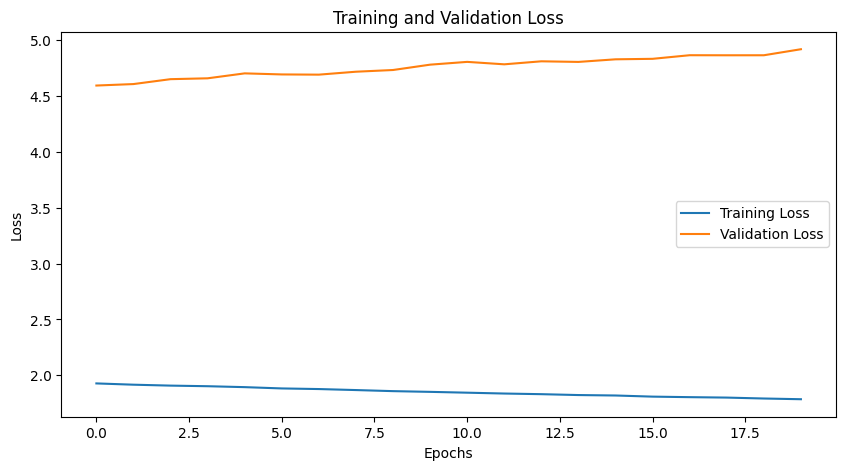

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()


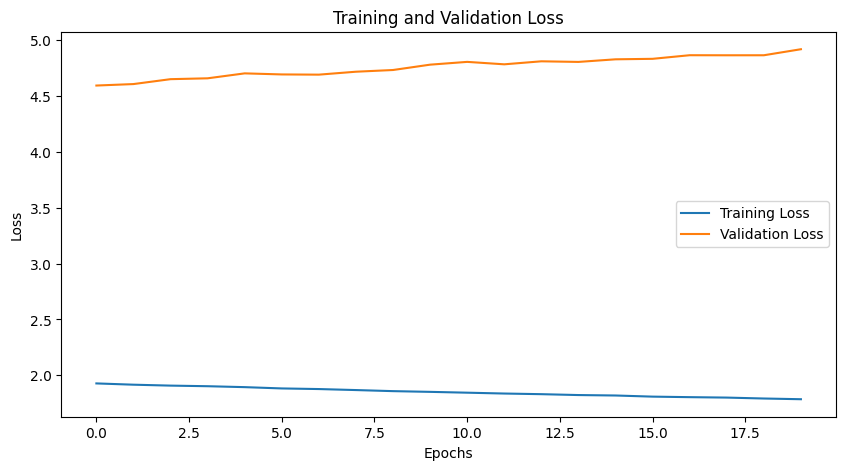

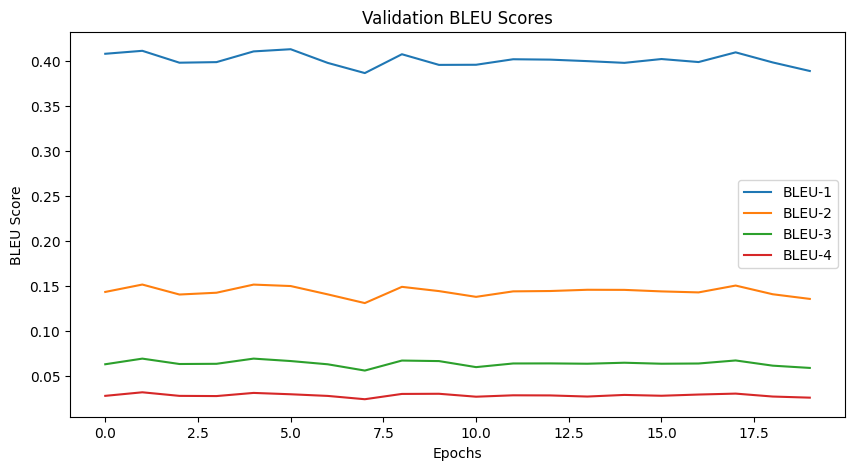

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(10, 5))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot BLEU-1 scores
# Plot BLEU scores
plt.figure(figsize=(10, 5))
plt.plot(val_bleu1_scores, label='BLEU-1')
plt.plot(val_bleu2_scores, label='BLEU-2')
plt.plot(val_bleu3_scores, label='BLEU-3')
plt.plot(val_bleu4_scores, label='BLEU-4')
plt.xlabel('Epochs')
plt.ylabel('BLEU Score')
plt.title('Validation BLEU Scores')
plt.legend()
plt.show()


In [ ]:
import matplotlib.pyplot as plt

---------------------Actual---------------------
startseq black dog and spotted dog are fighting endseq
startseq black dog and tricolored dog playing with each other on the road endseq
startseq black dog and white dog with brown spots are staring at each other in the street endseq
startseq two dogs of different breeds looking at each other on the road endseq
startseq two dogs on pavement moving toward each other endseq
--------------------Predicted--------------------
startseq two dogs are staring at each other on the road endseq


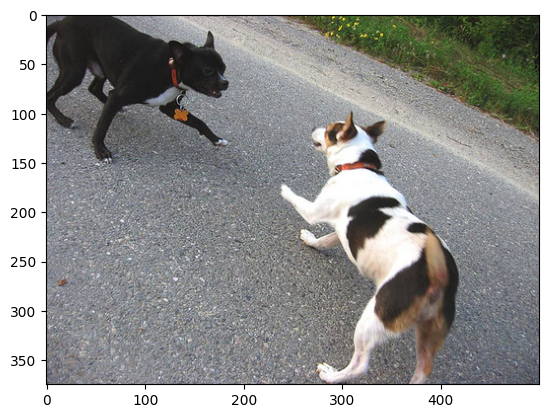

---------------------Actual---------------------
startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq
startseq little girl is sitting in front of large painted rainbow endseq
startseq small girl in the grass plays with fingerpaints in front of white canvas with rainbow on it endseq
startseq there is girl with pigtails sitting in front of rainbow painting endseq
startseq young girl with pigtails painting outside in the grass endseq
--------------------Predicted--------------------
startseq little girl with pigtails sitting in front of painted rainbow endseq


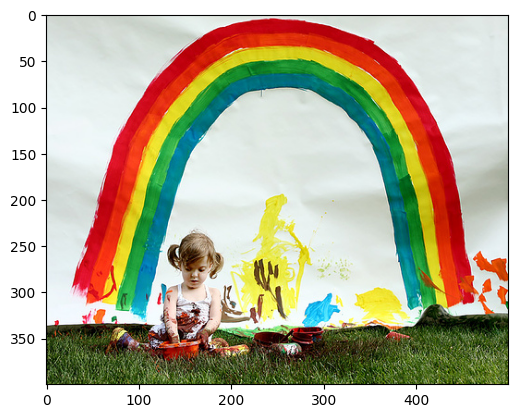

---------------------Actual---------------------
startseq man in hat is displaying pictures next to skier in blue hat endseq
startseq man skis past another man displaying paintings in the snow endseq
startseq person wearing skis looking at framed pictures set up in the snow endseq
startseq skier looks at framed pictures in the snow next to trees endseq
startseq man on skis looking at artwork for sale in the snow endseq
--------------------Predicted--------------------
startseq man in blue hat is displaying pictures in the snow endseq


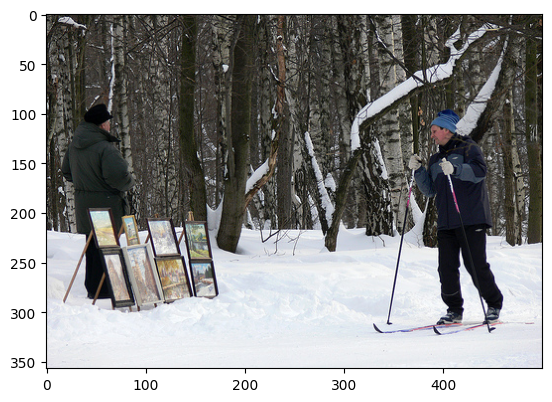

In [ ]:
def generate_caption(image_name):
    # Load the image
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
        print(caption)
    # Predict the caption
    y_pred = predict_caption(model, features[image_id][0], vocab, max_length, device)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)
    plt.show()

generate_caption("1001773457_577c3a7d70.jpg")
generate_caption("1002674143_1b742ab4b8.jpg")
generate_caption("101669240_b2d3e7f17b.jpg")


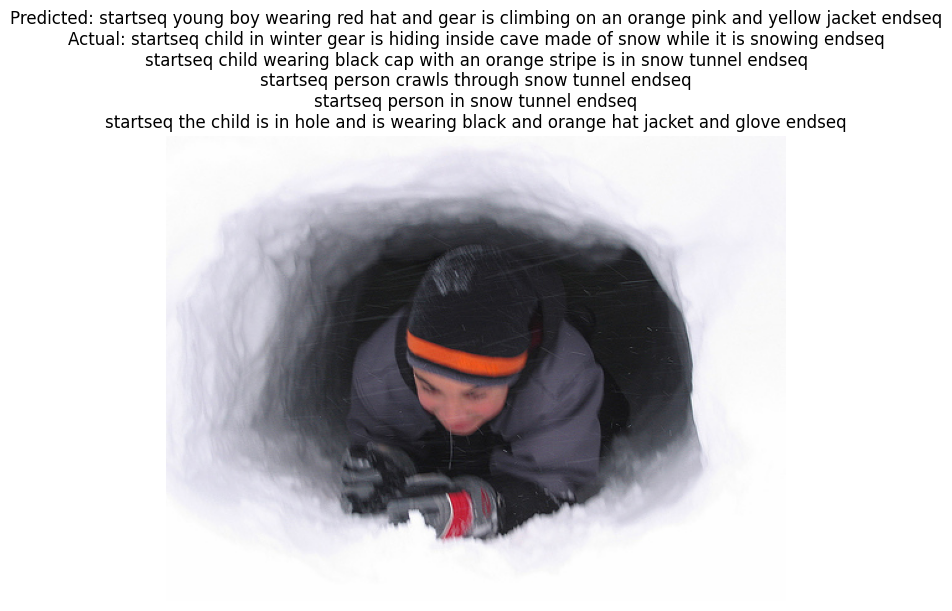

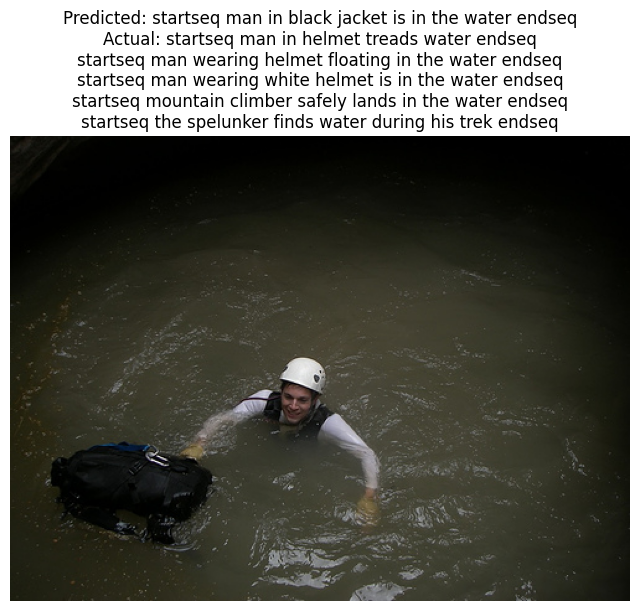

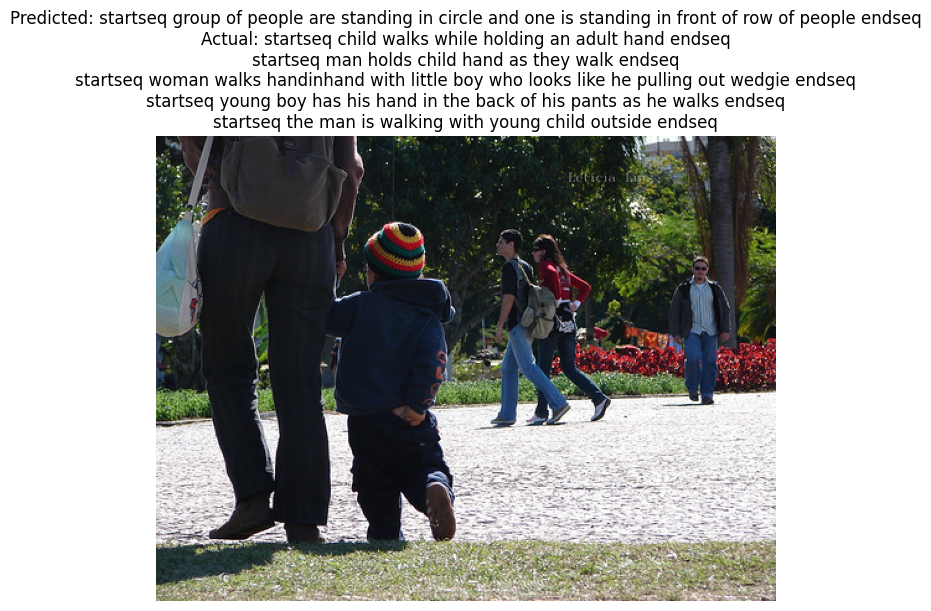

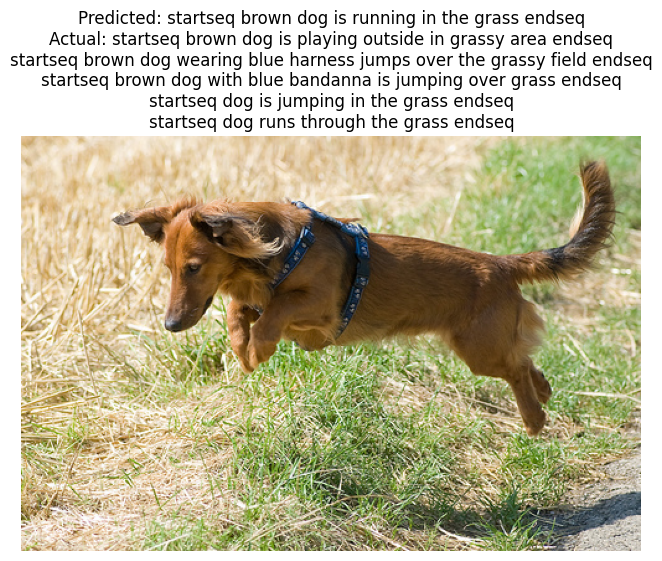

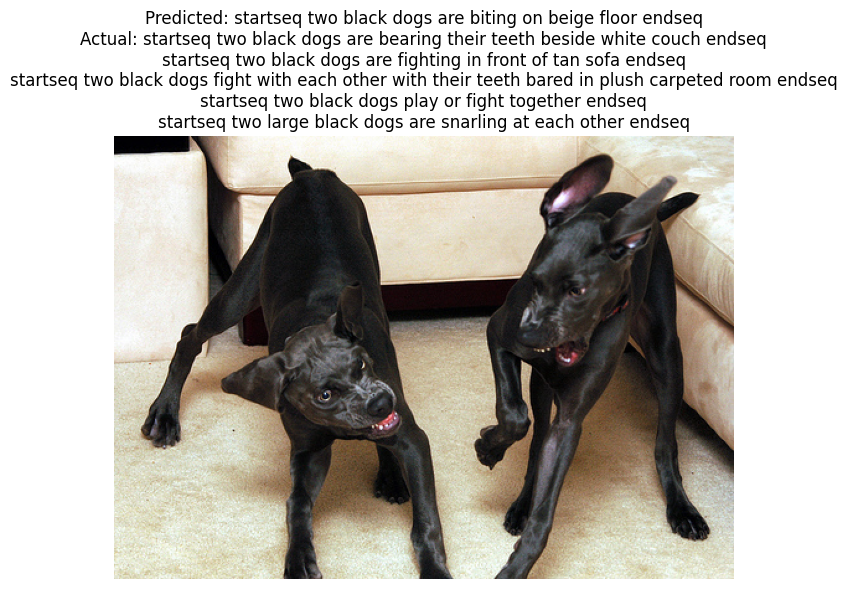

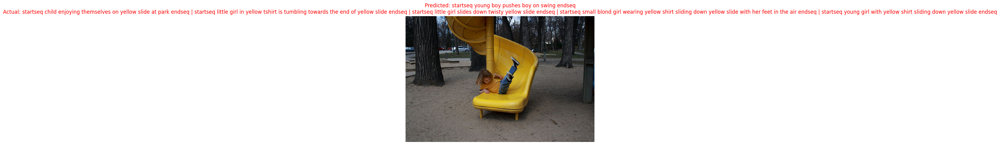

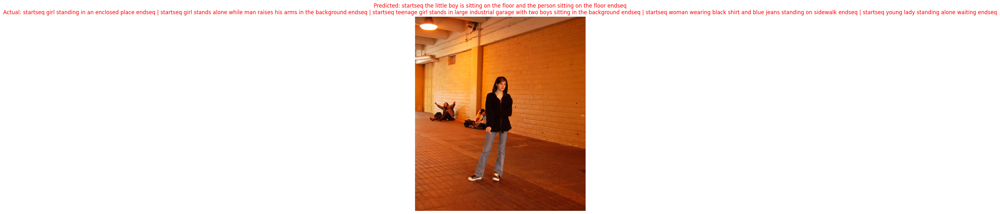

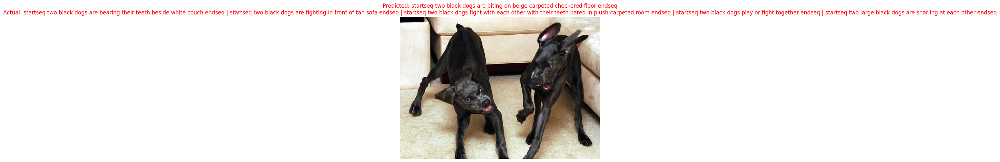

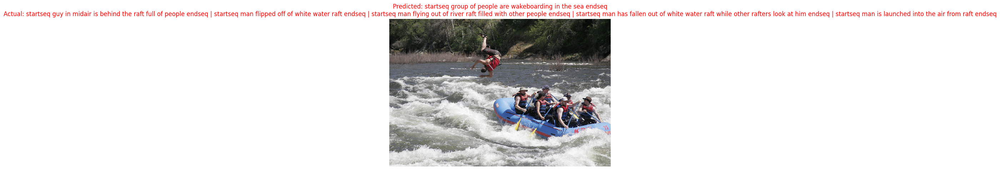

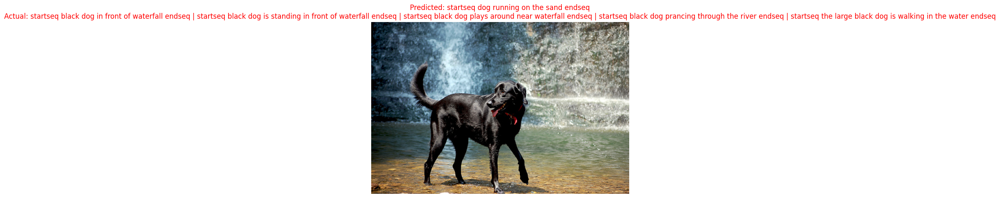

In [ ]:
def visualize_predictions(model, test_ids, mapping, features, vocab, max_length, device, num_samples=5):
    model.eval()
    samples = np.random.choice(test_ids, num_samples, replace=False)

    for sample in samples:
        image_feature = features[sample][0]
        actual_captions = mapping[sample]
        predicted_caption = predict_caption(model, image_feature, vocab, max_length, device)

        image_path = os.path.join(BASE_DIR, "Images", sample + ".jpg")
        image = Image.open(image_path)

        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.axis('off')
        plt.title("Predicted: " + predicted_caption + "\nActual: " + "\n".join(actual_captions))
        plt.show()

# Visualize predictions
visualize_predictions(model, test_ids, mapping, features, vocab, max_length, device)

def visualize_correct_incorrect_predictions(model, test_ids, mapping, features, vocab, max_length, device, num_samples=5):
    model.eval()
    samples = np.random.choice(test_ids, num_samples, replace=False)

    for sample in samples:
        image_feature = features[sample][0]
        actual_captions = mapping[sample]
        predicted_caption = predict_caption(model, image_feature, vocab, max_length, device)

        image_path = os.path.join(BASE_DIR, "Images", sample + ".jpg")
        image = Image.open(image_path)

        is_correct = any(predicted_caption in caption for caption in actual_captions)
        color = 'green' if is_correct else 'red'

        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Predicted: {predicted_caption}\nActual: {' | '.join(actual_captions)}", color=color)
        plt.show()

# Visualize correct and incorrect predictions
visualize_correct_incorrect_predictions(model, test_ids, mapping, features, vocab, max_length, device)


In [ ]:
import torchvision.models as models
import torchvision.transforms as transforms

# Load VGG16 model
vgg16 = models.vgg16(pretrained=True)
# Restructure the model
vgg16.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-1])
vgg16.eval()  # Set to evaluation mode

# Preprocessing function for VGG16
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def extract_features(image_path):
    image = Image.open(image_path).convert('RGB')
    image = preprocess(image).unsqueeze(0)  # Add batch dimension
    with torch.no_grad():
        features = vgg16(image).numpy()
    return features

image_path = '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg'
feature = extract_features(image_path)
# Predict caption from the trained model
print(predict_caption(model, feature[0], vocab, max_length, device))


startseq girl climbing in colorful dress endseq


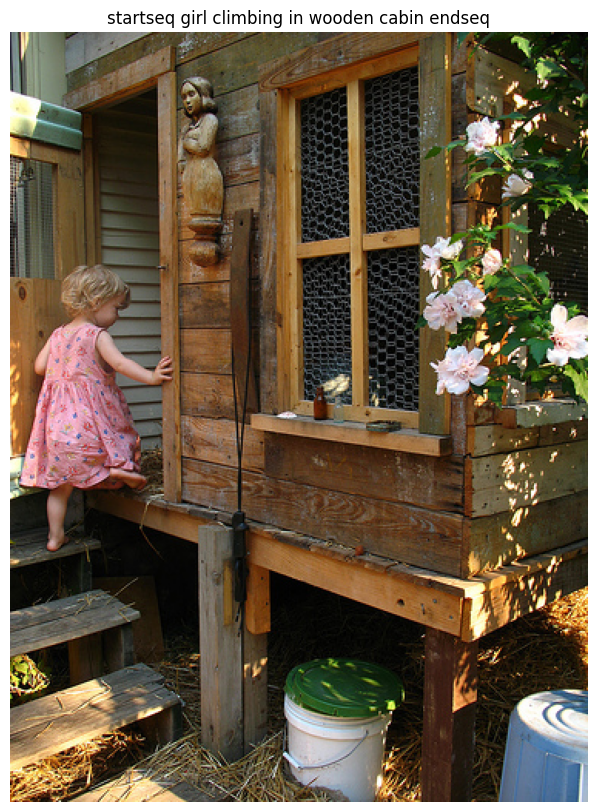

startseq girl climbing the stairs endseq


In [ ]:
vgg16 = models.vgg16(pretrained=True)
# Restructure the model
vgg16.classifier = nn.Sequential(*list(vgg16.classifier.children())[:-1])
vgg16.eval()  # Set to evaluation mode

# Preprocessing function for VGG16
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def extract_features(image_path):
    image = Image.open(image_path).convert('RGB')
    preprocessed_image = preprocess(image).unsqueeze(0)  # Add batch dimension
    with torch.no_grad():
        features = vgg16(preprocessed_image).numpy()
    return features, image  # Return both features and the original image

image_path = '/kaggle/input/flickr8k/Images/1000268201_693b08cb0e.jpg'
feature, image = extract_features(image_path)
# Predict caption from the trained model
predicted_caption = predict_caption(model, feature[0], vocab, max_length, device)

# Display the image with the predicted caption
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.title(predicted_caption)
plt.axis('off')
plt.show()
print(predict_caption(model, feature[0], vocab, max_length, device))